In [0]:
# set your initials here inside "", ex. Tanying Wang -> TW
initials="TW5"

In [0]:
# import the 2.5 million images
df = spark.sql("select image_path from meadowbank_prod.remote_cameras.md24_tws_manifest")

In [0]:
df.count() #should be around 2.5 million

2500332

In [0]:
# completely randomly select 100 images from the dataframe
from pyspark.sql import functions as F

# df contains column "image_path"
df_sampled = df.orderBy(F.rand()).limit(100)

In [0]:
# #output 100 images into csv file
# import pandas as pd

# reviewed_list=df_sampled.select("image_path").collect()

# clean_list = [r.image_path.replace("Row(image_path=", "") for r in reviewed_list]

# clean_list = [p[5:] if p.startswith("dbfs:") else p for p in clean_list]

# df_export = pd.DataFrame({
#     "image_path": clean_list,
#     "contains_animals": [""] * len(clean_list)
# })

# df_export.to_csv(f"/dbfs/FileStore/manual_validation_1128_{initials}.csv", index=False)

In [0]:
import pandas as pd
import io

csv_buffer = io.StringIO()

reviewed_list=df_sampled.select("image_path").collect()

clean_list = [r.image_path.replace("Row(image_path=", "") for r in reviewed_list]

clean_list = [p[5:] if p.startswith("dbfs:") else p for p in clean_list]

df_export = pd.DataFrame({
    "image_path": clean_list,
    "contains_animals": [""] * len(clean_list)
})

output_path = f"/tmp/manual_validation_1128_{initials}.csv"

df_export.to_csv(output_path, index=False)
print("Saved:", output_path)

dbutils.fs.cp(f"file:{output_path}", f"dbfs:/FileStore/manual_validation_1128_{initials}.csv")

Saved: /tmp/manual_validation_1128_TW5.csv


True

In [0]:
# show top 5 rows of df_export
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

df_export.head(5)

,image_path,contains_animals
0,/Volumes/meadowbank_prod/remote_cameras/mbk_remote_cameras_blob/2024/FirstPart/Camera 4/2024-07-06/104RECNX/RCNX0891.JPG,
1,/Volumes/meadowbank_prod/remote_cameras/mbk_remote_cameras_blob/2024/SecondPart/Camera/Camera 14/2024-12-07/100RECNX/RCNX0097.JPG,
2,/Volumes/meadowbank_prod/remote_cameras/mbk_remote_cameras_blob/2024/FirstPart/Camera 10 (Destroyed)/2024-03-07/100RECNX/RCNX2997.JPG,
3,/Volumes/meadowbank_prod/remote_cameras/mbk_remote_cameras_blob/2024/FirstPart/Camera 14/2024-03-07/100RECNX/RCNX0670.JPG,
4,/Volumes/meadowbank_prod/remote_cameras/mbk_remote_cameras_blob/2024/SecondPart/Camera/Camera 19/2024-10-05/100RECNX/RCNX5825.JPG,


In [0]:
# download the CSV file to your local machine
displayHTML(f'<a href="/files/manual_validation_1128_{initials}.csv" download>Click to download CSV</a>')

Click to download CSV

In [0]:
import os
import random
from PIL import Image
import matplotlib.pyplot as plt

def show_images_grid(image_paths, ncols=5, figsize=(20, 12), resize_to=600):
    """
    Display images in a grid with automatic resizing to avoid output size overflow.
    """
    n_images = len(image_paths)
    nrows = (n_images + ncols - 1) // ncols
    
    plt.figure(figsize=figsize)

    for i, path in enumerate(image_paths, 1):
        try:
            img = Image.open(path)

            # Resize to keep Databricks output small (prevents 20MB overflow)
            img.thumbnail((resize_to, resize_to))

            plt.subplot(nrows, ncols, i)
            plt.imshow(img)
            plt.axis("off")
            plt.title(os.path.basename(path), fontsize=10)
        except Exception as e:
            print(f"⚠️ Error loading {path}: {e}")

    plt.tight_layout()
    plt.show()



In [0]:
# show images in batches as we have 100 images and can only see 10 images per batch

def show_images_in_batches(image_list, batch_size=10):
    total = len(image_list)
    print(f"📸 Total images: {total}, showing {batch_size} per batch")

    for start in range(0, total, batch_size):
        end = min(start + batch_size, total)
        batch = image_list[start:end]

        print(f"\n➡️ Showing images {start+1} to {end} ...")

        show_images_grid(
            batch,
            ncols=5,             # 5 columns per row
            figsize=(20, 12),    # enlarge layout
            resize_to=600        # bigger images
        )


📸 Total images: 100, showing 10 per batch

➡️ Showing images 1 to 10 ...


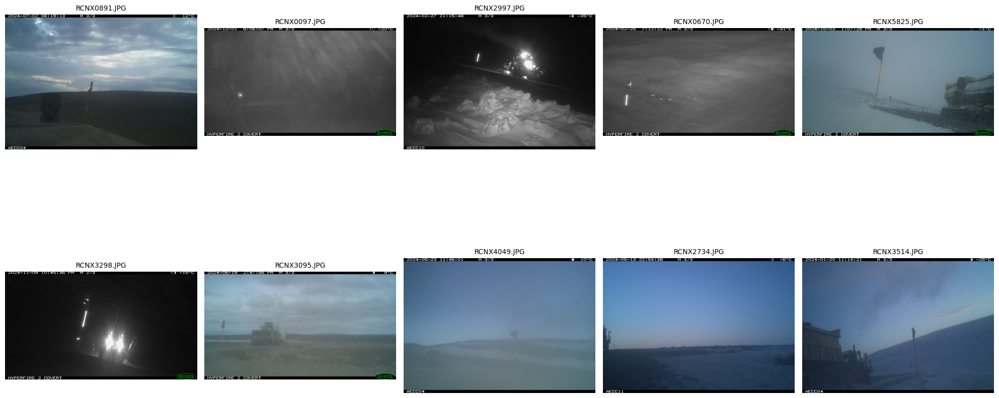


➡️ Showing images 11 to 20 ...


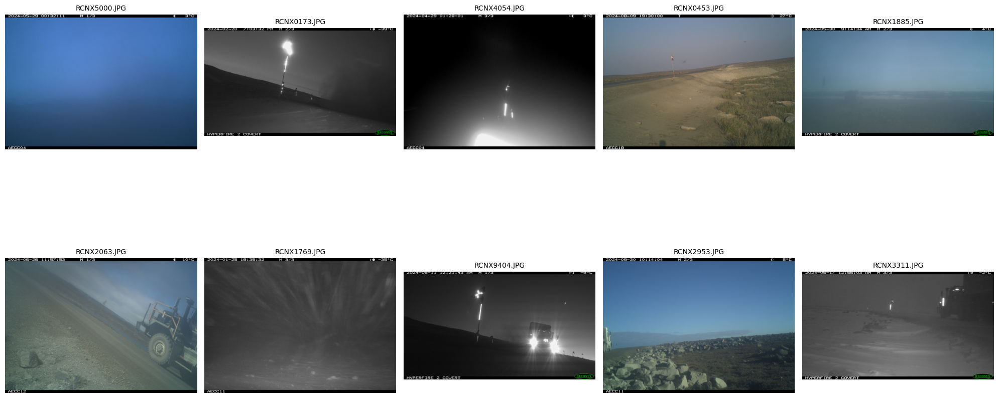


➡️ Showing images 21 to 30 ...


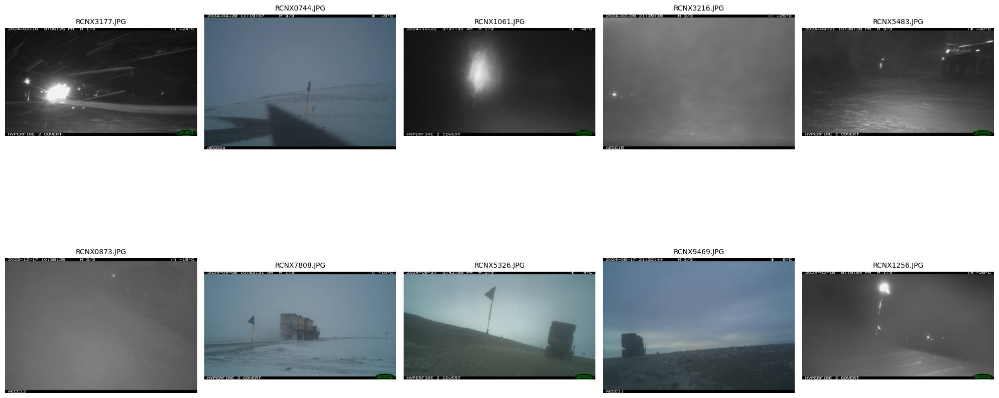


➡️ Showing images 31 to 40 ...


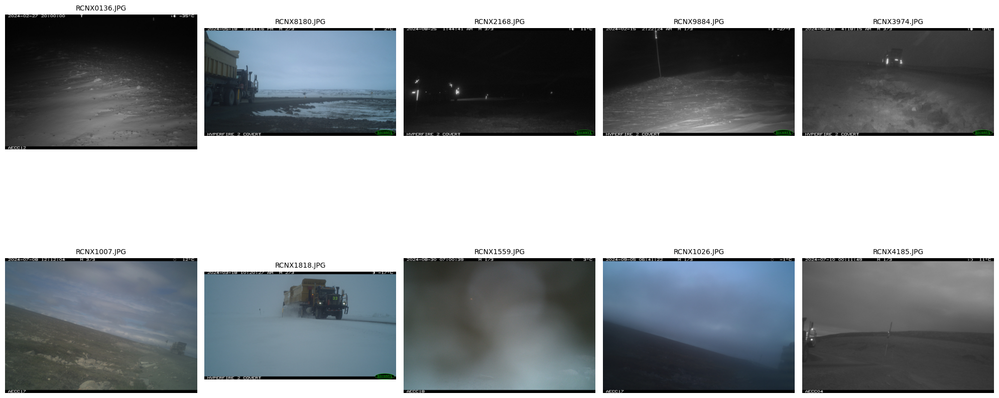


➡️ Showing images 41 to 50 ...


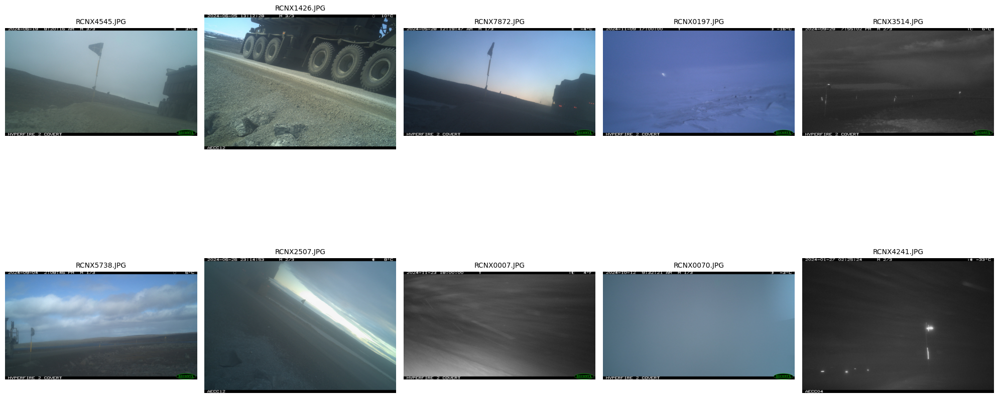


➡️ Showing images 51 to 60 ...


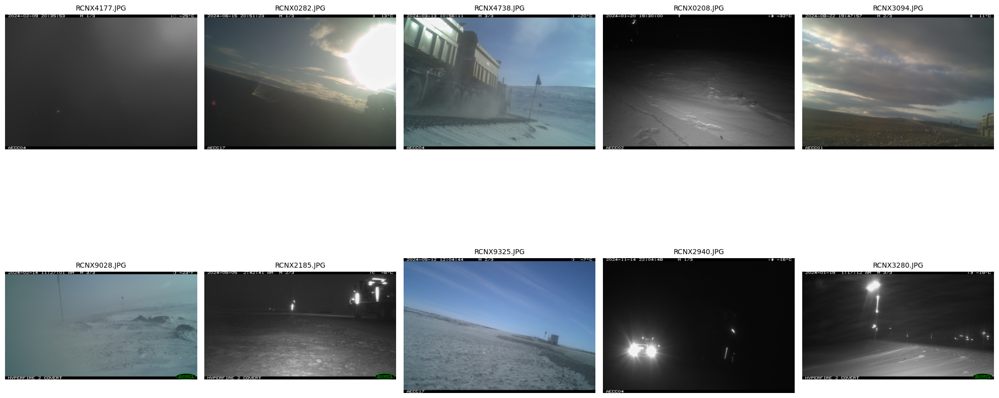


➡️ Showing images 61 to 70 ...


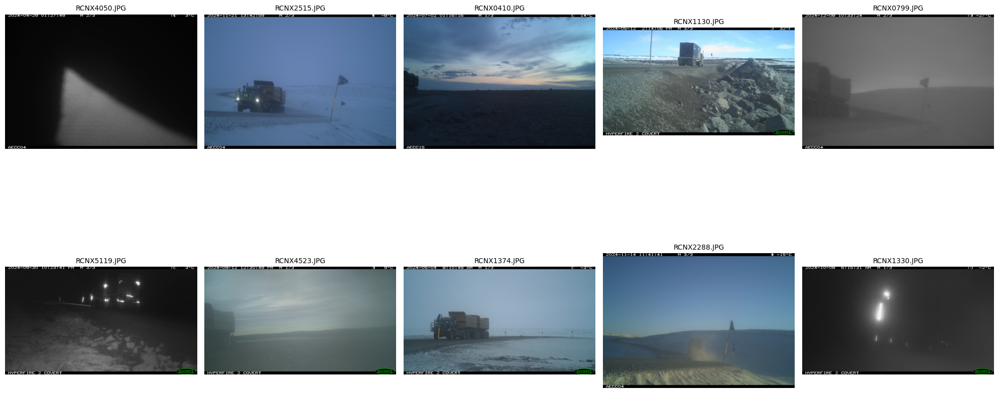


➡️ Showing images 71 to 80 ...


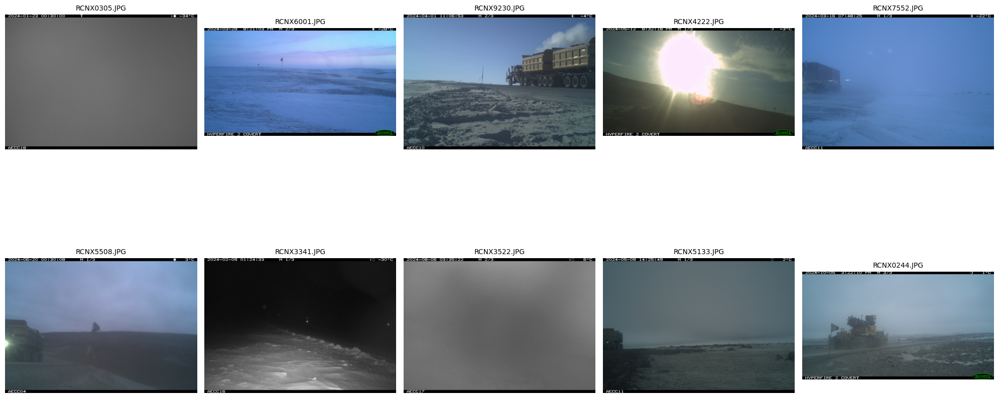


➡️ Showing images 81 to 90 ...


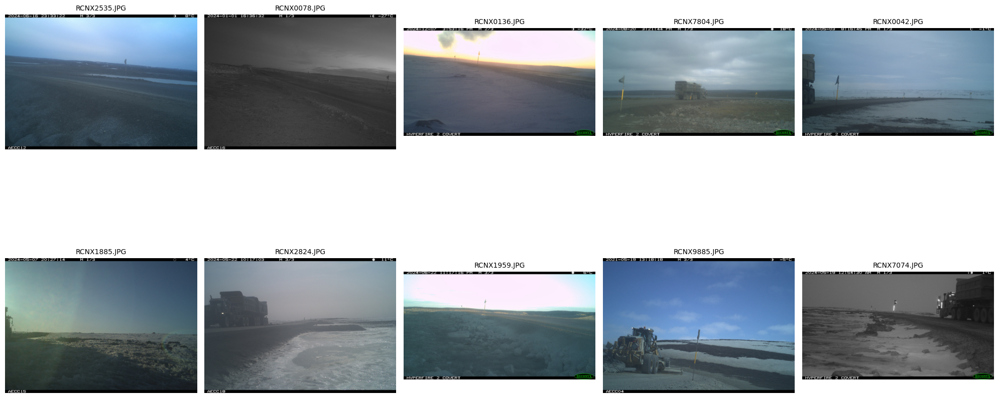


➡️ Showing images 91 to 100 ...


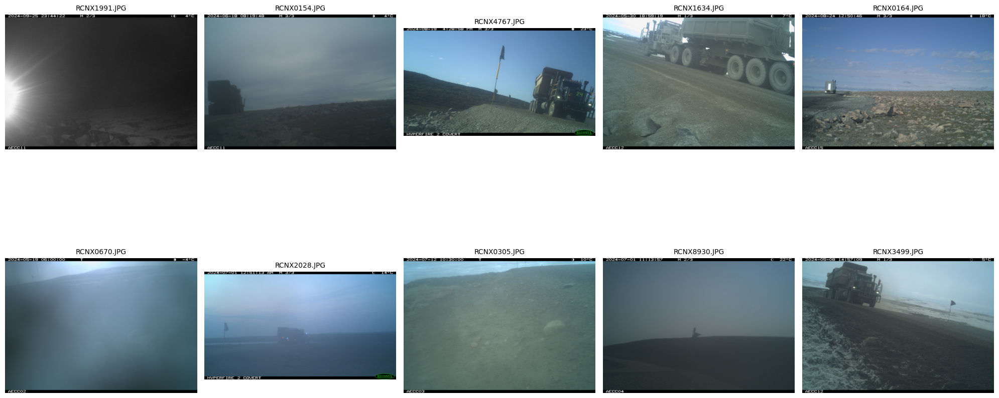

In [0]:
# show images with 10 images per batch
show_images_in_batches(clean_list)

### To zoom in and check individual image

In [0]:
import os
from PIL import Image
from IPython.display import display

def show_image_or_images(path):
    """
    Display a single image if path is a file, or recursively display all images if it's a directory.
    Works with /Volumes/ paths by converting to /dbfs/.
    """
    # Convert /Volumes path for Databricks-FileSystem compatibility
    if path.startswith("/Volumes/"):
        path = path

    # Supported image extensions
    image_extensions = {".jpg", ".jpeg", ".png", ".bmp", ".gif", ".tif", ".tiff"}

    if os.path.isfile(path):  # Single image file
        try:
            img = Image.open(path)
            print(f"Displaying single image: {path}")
            display(img)
        except Exception as e:
            print(f"Error opening image {path}: {e}")
    elif os.path.isdir(path):  # Directory: show all images recursively
        print(f"Listing all images in folder: {path}")
        for root, _, files in os.walk(path):
            for file in files:
                if os.path.splitext(file)[1].lower() in image_extensions:
                    image_path = os.path.join(root, file)
                    try:
                        img = Image.open(image_path)
                        print(f"Displaying image: {image_path}")
                        display(img)
                    except Exception as e:
                        print(f"Error displaying image {image_path}: {e}")
    else:
        print(f"Path does not exist: {path}")

Displaying single image: /Volumes/meadowbank_prod/remote_cameras/mbk_remote_cameras_blob/2024/SecondPart/Camera/Camera 13/2024-11-12/100RECNX/RCNX1120.JPG


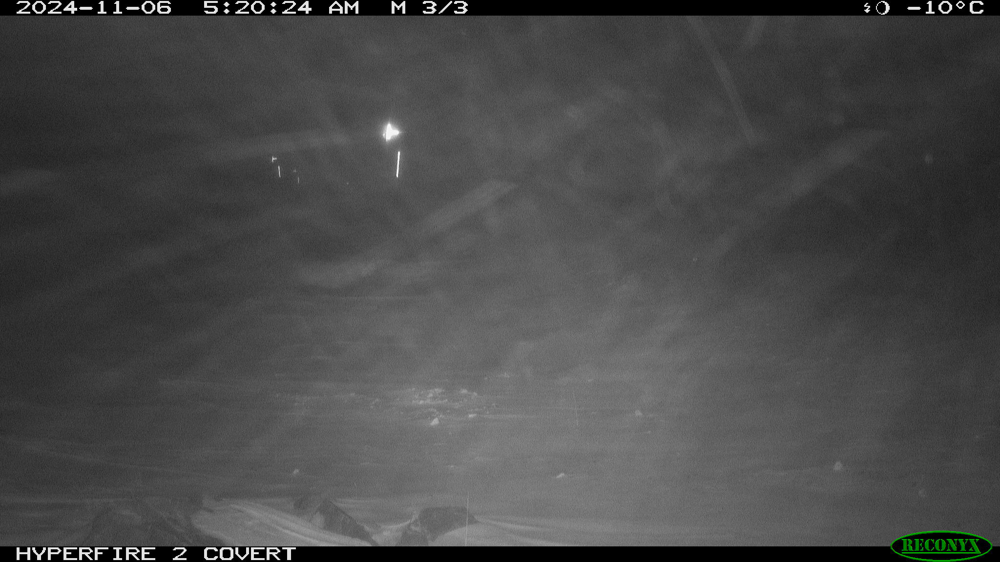

In [0]:
# Example usage
image_path = "/Volumes/meadowbank_prod/remote_cameras/mbk_remote_cameras_blob/2024/SecondPart/Camera/Camera 13/2024-11-12/100RECNX/RCNX1120.JPG"
show_image_or_images(image_path)